In [ ]:
# This notebook is to make Figure S6 of Rodgers et al. 2021 (https://doi.org/10.5194/esd-2021-50). 
# If you have have any questions, please contact the author of this notebook.
# Author: Ryohei Yamaguchi (ryamaguchi  at  pusan.ac.kr)

In [1]:
from dask.distributed import Client
client = Client(scheduler_file='/proj/ryamaguchi/Dask/run_1/scheduler.json')
client

Client Scheduler: tcp://203.247.189.225:42362 Dashboard: http://203.247.189.225:8785/status,Cluster Workers: 8 Cores: 144 Memory: 480.00 GB


### Import

In [2]:
%matplotlib inline

import numpy as np
from scipy import stats,signal
import xarray as xr
import matplotlib
import matplotlib.pyplot as plt
#import matplotlib.path as mpath
import matplotlib.ticker as mticker
#import matplotlib.gridspec as gridspec
from matplotlib import colors
import cartopy.crs as ccrs
import cartopy.feature as cf
import cmaps
from cmcrameri import cm
import math,copy
import glob
import string
from tqdm.notebook import tqdm_notebook

import pop_tools
pop_grid = pop_tools.get_grid('POP_gx1v7')

from datetime import datetime
today = datetime.today()

import os

/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 10005. The TBB threading layer is disabled.
  warnings.warn(problem)


In [3]:
from cartopy.util import add_cyclic_point

def xr_add_cyclic(da):
    lon_idx = da.dims.index('lon')
    wrap_data, wrap_lon = add_cyclic_point(da.values, coord=da.lon, axis=lon_idx)

    outp_da = xr.DataArray(data=wrap_data, coords = {'lat': da.lat, 'lon': wrap_lon}, 
                           dims=da.dims,attrs=da.attrs)

    return outp_da

In [4]:
def pop_add_cyclic(da):
    #copied from Mattew Longs github (https://gist.github.com/matt-long/50433da346da8ac17cde926eec90a87c) and modified for DA 
    #This doesn't work with Dask (DA should be loaded)
    #Input DA must have the name and coords (TLONG and TLAT), and don't have other dims (time etc.)
    
    nj = pop_grid.TLAT.shape[0]
    ni = pop_grid.TLONG.shape[1]

    xL = int(ni/2 - 1)
    xR = int(xL + ni)

    tlon = pop_grid.TLONG.data
    tlat = pop_grid.TLAT.data
    
    tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon)    
    lon  = np.concatenate((tlon, tlon + 360.), 1)
    lon = lon[:, xL:xR]

    if ni == 320:
        lon[367:-3, 0] = lon[367:-3, 0] + 360.        
    lon = lon - 360.
    
    lon = np.hstack((lon, lon[:, 0:1] + 360.))
    if ni == 320:
        lon[367:, -1] = lon[367:, -1] - 360.

    #-- trick cartopy into doing the right thing:
    #   it gets confused when the cyclic coords are identical
    lon[:, 0] = lon[:, 0] - 1e-8

    #-- periodicity
    lat = np.concatenate((tlat, tlat), 1)
    lat = lat[:, xL:xR]
    lat = np.hstack((lat, lat[:,0:1]))

    TLAT = xr.DataArray(lat, dims=('nlat', 'nlon'))
    TLONG = xr.DataArray(lon, dims=('nlat', 'nlon'))
    

    # copy vars
    v = da.name
    v_dims = da.dims
    
    # determine and sort other dimensions
    other_dims = set(v_dims) - {'nlat', 'nlon'}
    other_dims = tuple([d for d in v_dims if d in other_dims])
    lon_dim = da.dims.index('nlon')
    field = da.data
    field = np.concatenate((field, field), lon_dim)
    field = field[..., :, xL:xR]
    field = np.concatenate((field, field[..., :, 0:1]), lon_dim)       
    dao = xr.DataArray(field, dims=other_dims+('nlat', 'nlon'), attrs=da.attrs)
    dao = dao.assign_coords(TLONG=TLONG)
    dao = dao.assign_coords(TLAT=TLAT)

            
    return dao

def pop_add_cyclic_u(da):
    #copied from Mattew Longs github (https://gist.github.com/matt-long/50433da346da8ac17cde926eec90a87c) and modified for DA 
    #This doesn't work with Dask (DA should be loaded)
    #Input DA must have the name and coords (TLONG and TLAT), and don't have other dims (time etc.)
    
    nj = pop_grid.ULAT.shape[0]
    ni = pop_grid.ULONG.shape[1]

    xL = int(ni/2 - 1)
    xR = int(xL + ni)

    tlon = pop_grid.ULONG.data
    tlat = pop_grid.ULAT.data
    
    tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon)    
    lon  = np.concatenate((tlon, tlon + 360.), 1)
    lon = lon[:, xL:xR]

    if ni == 320:
        lon[367:-3, 0] = lon[367:-3, 0] + 360.        
    lon = lon - 360.
    
    lon = np.hstack((lon, lon[:, 0:1] + 360.))
    if ni == 320:
        lon[367:, -1] = lon[367:, -1] - 360.

    #-- trick cartopy into doing the right thing:
    #   it gets confused when the cyclic coords are identical
    lon[:, 0] = lon[:, 0] - 1e-8

    #-- periodicity
    lat = np.concatenate((tlat, tlat), 1)
    lat = lat[:, xL:xR]
    lat = np.hstack((lat, lat[:,0:1]))

    ULAT = xr.DataArray(lat, dims=('nlat', 'nlon'))
    ULONG = xr.DataArray(lon, dims=('nlat', 'nlon'))
    

    # copy vars
    v = da.name
    v_dims = da.dims
    
    # determine and sort other dimensions
    other_dims = set(v_dims) - {'nlat', 'nlon'}
    other_dims = tuple([d for d in v_dims if d in other_dims])
    lon_dim = da.dims.index('nlon')
    field = da.data
    field = np.concatenate((field, field), lon_dim)
    field = field[..., :, xL:xR]
    field = np.concatenate((field, field[..., :, 0:1]), lon_dim)       
    dao = xr.DataArray(field, dims=other_dims+('nlat', 'nlon'), attrs=da.attrs)
    dao = dao.assign_coords(ULONG=ULONG)
    dao = dao.assign_coords(ULAT=ULAT)

            
    return dao

In [5]:
from scipy.interpolate import griddata
#method=['nearest','linear','cubic']

def remap_pop_xy(da,method='linear',grid='T') :
    if grid=='T':
        x,y='TLONG','TLAT'
    else :
        x,y='ULONG','ULAT'
        
    values = da.values.flatten()
    tlats = da[y].values.flatten()
    tlons = da[x].values.flatten()
    points = np.empty([da.size,2])
    points[:,1] = tlats
    points[:,0] = tlons
 
    ds_cam = xr.open_dataset('/proj/ryamaguchi/00_prgs/plot/b.e21.BHISTsmbb.f09_g17.LE2-1231.011.cam.h0.LANDFRAC.185001-185912.nc')
    frac=ds_cam.LANDFRAC.isel(time=0).drop('time').load()
#    ds_mask=xr.open_dataset('/proj/shared_data/ensemble_simulations/script/region_mask/region_mask.gx1v7.POP_CESM2.1x1.nc')
#    frac=xr.where(ds_mask.region_mask==0,1,0)
    
    points = points[~np.isnan(values),:]
    values = values[~np.isnan(values)]

    lon = frac.lon.values
    lat = frac.lat.values
    
    grid_x, grid_y = np.meshgrid(lon, lat)

    yx = griddata(points, values, (grid_x, grid_y), method=method) 
    yx[np.where(frac > 0.9)] = float('nan')
    
    dao = xr.DataArray(yx,dims=['lat','lon'],coords=[lat,lon])
    return dao

### Read

In [6]:
variables=['FLNT'  ,'FSNT'  ,'PRECT' ,'TREFHT','NPP'    ,'photoC_TOT_zint','NBP'    ,'FG_CO2','TEMP' ,'RHO'  ]
models   =['cam.h0','cam.h0','cam.h0','cam.h0','clm2.h0','pop.h'          ,'clm2.h0','pop.h' ,'pop.h','pop.h']

scenarios=('HIST','SSP370')
members_cmip = ('1001.001','1021.002','1041.003','1061.004','1081.005','1101.006','1121.007','1141.008','1161.009','1181.010',
                '1231.001','1231.002','1231.003','1231.004','1231.005','1231.006','1231.007','1231.008','1231.009','1231.010',
                '1251.001','1251.002','1251.003','1251.004','1251.005','1251.006','1251.007','1251.008','1251.009','1251.010',
                '1281.001','1281.002','1281.003','1281.004','1281.005','1281.006','1281.007','1281.008','1281.009','1281.010',
                '1301.001','1301.002','1301.003','1301.004','1301.005','1301.006','1301.007','1301.008','1301.009','1301.010')
members_smbb = ('1011.001','1031.002','1051.003','1071.004','1091.005','1111.006','1131.007','1151.008','1171.009','1191.010',
                '1231.011','1231.012','1231.013','1231.014','1231.015','1231.016','1231.017','1231.018','1231.019','1231.020',
                '1251.011','1251.012','1251.013','1251.014','1251.015','1251.016','1251.017','1251.018','1251.019','1251.020',
                '1281.011','1281.012','1281.013','1281.014','1281.015','1281.016','1281.017','1281.018','1281.019','1281.020',
                '1301.011','1301.012','1301.013','1301.014','1301.015','1301.016','1301.017','1301.018','1301.019','1301.020')
members=np.append(members_cmip,members_smbb)
ensembles = [ens for ens in range(len(members))]

In [7]:
exceptcv=['time','nlat','nlon','z_t','lon','lat',*variables]
def process_coords(ds,except_coord_vars=exceptcv):
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    return ds.drop(coord_vars)

In [8]:
def make_file_list(variables,models,members,scenarios):
    file_list=np.array([])
    for i,var in enumerate(variables) :
        ens_files=np.array([])
        for j,member in enumerate(members) :
            files=[]
            for scenario in scenarios :
                file = '/proj/jedwards/archive/b.e21.B'+scenario+'*.f09_g17.LE2-'+member+'/*/proc/tseries/'\
                       'month_1/b.e21.B'+scenario+'*.f09_g17.LE2-'+member+'.'+models[i]+'.'+var+'.*.nc'
                files += glob.glob(file)
            files = sorted(files)
            if len(files)!=26 : print(var,member,len(files))
            if j==0 : ens_files=np.array(files)
            if j!=0 : ens_files=np.concatenate([ens_files,np.array(files)])
        ens_files=ens_files.reshape((len(members),26))
        if i==0 : file_list=ens_files
        if i!=0 : file_list=np.concatenate([file_list,ens_files])
    return file_list.reshape((len(variables),len(members),26))

In [9]:
file_list=make_file_list(variables,models,members,scenarios)

for i in range(len(variables)):
    print(i,variables[i],len(file_list[i,:,25]))

0 FLNT 100
1 FSNT 100
2 PRECT 100
3 TREFHT 100
4 NPP 100
5 photoC_TOT_zint 100
6 NBP 100
7 FG_CO2 100
8 TEMP 100
9 RHO 100


In [10]:
syr1,eyr1=1960,1989
syr2,eyr2=2070,2099

syr_f1,eyr_f1=1960,1989
syr_f2,eyr_f2=2065,2100

syr_if1,eyr_if1=11,13
syr_if2,eyr_if2=22,25

In [11]:
file_list[0,0,syr_if1:eyr_if1+1].tolist()

['/proj/jedwards/archive/b.e21.BHISTcmip6.f09_g17.LE2-1001.001/atm/proc/tseries/month_1/b.e21.BHISTcmip6.f09_g17.LE2-1001.001.cam.h0.FLNT.196001-196912.nc',
 '/proj/jedwards/archive/b.e21.BHISTcmip6.f09_g17.LE2-1001.001/atm/proc/tseries/month_1/b.e21.BHISTcmip6.f09_g17.LE2-1001.001.cam.h0.FLNT.197001-197912.nc',
 '/proj/jedwards/archive/b.e21.BHISTcmip6.f09_g17.LE2-1001.001/atm/proc/tseries/month_1/b.e21.BHISTcmip6.f09_g17.LE2-1001.001.cam.h0.FLNT.198001-198912.nc']

In [12]:
file_list[0,0,syr_if2:eyr_if2+1].tolist()

['/proj/jedwards/archive/b.e21.BSSP370cmip6.f09_g17.LE2-1001.001/atm/proc/tseries/month_1/b.e21.BSSP370cmip6.f09_g17.LE2-1001.001.cam.h0.FLNT.206501-207412.nc',
 '/proj/jedwards/archive/b.e21.BSSP370cmip6.f09_g17.LE2-1001.001/atm/proc/tseries/month_1/b.e21.BSSP370cmip6.f09_g17.LE2-1001.001.cam.h0.FLNT.207501-208412.nc',
 '/proj/jedwards/archive/b.e21.BSSP370cmip6.f09_g17.LE2-1001.001/atm/proc/tseries/month_1/b.e21.BSSP370cmip6.f09_g17.LE2-1001.001.cam.h0.FLNT.208501-209412.nc',
 '/proj/jedwards/archive/b.e21.BSSP370cmip6.f09_g17.LE2-1001.001/atm/proc/tseries/month_1/b.e21.BSSP370cmip6.f09_g17.LE2-1001.001.cam.h0.FLNT.209501-210012.nc']

In [13]:
ds_0_hist=xr.open_mfdataset(file_list[0,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_1_hist=xr.open_mfdataset(file_list[1,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_2_hist=xr.open_mfdataset(file_list[2,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_3_hist=xr.open_mfdataset(file_list[3,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_4_hist=xr.open_mfdataset(file_list[4,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_5_hist=xr.open_mfdataset(file_list[5,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_6_hist=xr.open_mfdataset(file_list[6,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_7_hist=xr.open_mfdataset(file_list[7,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_8_hist=xr.open_mfdataset(file_list[8,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':1},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_9_hist=xr.open_mfdataset(file_list[9,:,syr_if1:eyr_if1+1].tolist(),chunks={'time':1},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)

In [14]:
ds_0_ssp3=xr.open_mfdataset(file_list[0,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_1_ssp3=xr.open_mfdataset(file_list[1,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_2_ssp3=xr.open_mfdataset(file_list[2,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_3_ssp3=xr.open_mfdataset(file_list[3,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_4_ssp3=xr.open_mfdataset(file_list[4,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_5_ssp3=xr.open_mfdataset(file_list[5,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_6_ssp3=xr.open_mfdataset(file_list[6,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_7_ssp3=xr.open_mfdataset(file_list[7,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':120},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_8_ssp3=xr.open_mfdataset(file_list[8,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':1},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)
ds_9_ssp3=xr.open_mfdataset(file_list[9,:,syr_if2:eyr_if2+1].tolist(),chunks={'time':1},combine='nested',concat_dim=[[*ensembles],'time'],
                         parallel='True',preprocess=process_coords,decode_cf=True,decode_times=True)

In [15]:
print(ds_9_hist.time.values[ 0])
print(ds_9_hist.time.values[-1])
print(ds_9_ssp3.time.values[ 0])
print(ds_9_ssp3.time.values[-1])

1960-02-01 00:00:00
1990-01-01 00:00:00
2065-02-01 00:00:00
2101-01-01 00:00:00


In [16]:
time_new=xr.cftime_range(start=str(syr_f1),end=str(eyr_f1+1),freq='1M',calendar='noleap')
ds_0_hist=ds_0_hist.assign_coords(time=time_new)
ds_1_hist=ds_1_hist.assign_coords(time=time_new)
ds_2_hist=ds_2_hist.assign_coords(time=time_new)
ds_3_hist=ds_3_hist.assign_coords(time=time_new)
ds_4_hist=ds_4_hist.assign_coords(time=time_new)
ds_5_hist=ds_5_hist.assign_coords(time=time_new)
ds_6_hist=ds_6_hist.assign_coords(time=time_new)
ds_7_hist=ds_7_hist.assign_coords(time=time_new)
ds_8_hist=ds_8_hist.assign_coords(time=time_new)
ds_9_hist=ds_9_hist.assign_coords(time=time_new)

ds_5_hist=ds_5_hist.assign_coords(z_t=pop_grid.z_t)
ds_7_hist=ds_7_hist.assign_coords(z_t=pop_grid.z_t)
ds_8_hist=ds_8_hist.assign_coords(z_t=pop_grid.z_t)
ds_9_hist=ds_9_hist.assign_coords(z_t=pop_grid.z_t)
ds_5_hist=ds_5_hist.assign_coords(TLONG=pop_grid.TLONG)
ds_7_hist=ds_7_hist.assign_coords(TLONG=pop_grid.TLONG)
ds_8_hist=ds_8_hist.assign_coords(TLONG=pop_grid.TLONG)
ds_9_hist=ds_9_hist.assign_coords(TLONG=pop_grid.TLONG)
ds_5_hist=ds_5_hist.assign_coords(TLAT =pop_grid.TLAT) 
ds_7_hist=ds_7_hist.assign_coords(TLAT =pop_grid.TLAT) 
ds_8_hist=ds_8_hist.assign_coords(TLAT =pop_grid.TLAT) 
ds_9_hist=ds_9_hist.assign_coords(TLAT =pop_grid.TLAT) 

In [17]:
time_new=xr.cftime_range(start=str(syr_f2),end=str(eyr_f2+1),freq='1M',calendar='noleap')
ds_0_ssp3=ds_0_ssp3.assign_coords(time=time_new)
ds_1_ssp3=ds_1_ssp3.assign_coords(time=time_new)
ds_2_ssp3=ds_2_ssp3.assign_coords(time=time_new)
ds_3_ssp3=ds_3_ssp3.assign_coords(time=time_new)
ds_4_ssp3=ds_4_ssp3.assign_coords(time=time_new)
ds_5_ssp3=ds_5_ssp3.assign_coords(time=time_new)
ds_6_ssp3=ds_6_ssp3.assign_coords(time=time_new)
ds_7_ssp3=ds_7_ssp3.assign_coords(time=time_new)
ds_8_ssp3=ds_8_ssp3.assign_coords(time=time_new)
ds_9_ssp3=ds_9_ssp3.assign_coords(time=time_new)

ds_5_ssp3=ds_5_ssp3.assign_coords(z_t=pop_grid.z_t)
ds_7_ssp3=ds_7_ssp3.assign_coords(z_t=pop_grid.z_t)
ds_8_ssp3=ds_8_ssp3.assign_coords(z_t=pop_grid.z_t)
ds_9_ssp3=ds_9_ssp3.assign_coords(z_t=pop_grid.z_t)
ds_5_ssp3=ds_5_ssp3.assign_coords(TLONG=pop_grid.TLONG)
ds_7_ssp3=ds_7_ssp3.assign_coords(TLONG=pop_grid.TLONG)
ds_8_ssp3=ds_8_ssp3.assign_coords(TLONG=pop_grid.TLONG)
ds_9_ssp3=ds_9_ssp3.assign_coords(TLONG=pop_grid.TLONG)
ds_5_ssp3=ds_5_ssp3.assign_coords(TLAT =pop_grid.TLAT) 
ds_7_ssp3=ds_7_ssp3.assign_coords(TLAT =pop_grid.TLAT) 
ds_8_ssp3=ds_8_ssp3.assign_coords(TLAT =pop_grid.TLAT) 
ds_9_ssp3=ds_9_ssp3.assign_coords(TLAT =pop_grid.TLAT) 

In [18]:
toaf1=ds_1_hist[variables[1]].groupby('time.year').mean()-ds_0_hist[variables[0]].groupby('time.year').mean()
prec1=ds_2_hist[variables[2]].groupby('time.year').mean()*(1e3)*60.*60.*24. # m s-1 -> mm day-1
tref1=ds_3_hist[variables[3]].groupby('time.year').mean()-273.15     
LNPP1=ds_4_hist[variables[4]].groupby('time.year').mean()*60.*60.*24.*365. #gC m-2 s-1 -> gC m-2 yr-1
ONPP1=ds_5_hist[variables[5]].groupby('time.year').mean()*(1e-3)*(12.)*(1e-2)*60.*60.*24.*365. #mmol m-3 cm s-1 -> gC m-2 yr-1
LCO21=ds_6_hist[variables[6]].groupby('time.year').mean()*60.*60.*24.*365. #gC m-2 s-1 -> gC m-2 yr-1
OCO21=ds_7_hist[variables[7]].groupby('time.year').mean()*(1e-3)*(12.)*(1e-2)*60.*60.*24.*365. #mmol m-3 cm s-1 -> gC m-2 yr-1

toaf2=ds_1_ssp3[variables[1]].groupby('time.year').mean()-ds_0_ssp3[variables[0]].groupby('time.year').mean()
prec2=ds_2_ssp3[variables[2]].groupby('time.year').mean()*(1e3)*60.*60.*24. # m s-1 -> mm day-1
tref2=ds_3_ssp3[variables[3]].groupby('time.year').mean()-273.15     
LNPP2=ds_4_ssp3[variables[4]].groupby('time.year').mean()*60.*60.*24.*365. #gC m-2 s-1 -> gC m-2 yr-1
ONPP2=ds_5_ssp3[variables[5]].groupby('time.year').mean()*(1e-3)*(12.)*(1e-2)*60.*60.*24.*365. #mmol m-3 cm s-1 -> gC m-2 yr-1
LCO22=ds_6_ssp3[variables[6]].groupby('time.year').mean()*60.*60.*24.*365. #gC m-2 s-1 -> gC m-2 yr-1
OCO22=ds_7_ssp3[variables[7]].groupby('time.year').mean()*(1e-3)*(12.)*(1e-2)*60.*60.*24.*365. #mmol m-3 cm s-1 -> gC m-2 yr-1

lat=ds_1_hist.lat
lon=ds_1_hist.lon

In [19]:
dz  =(pop_grid.dz*1e-2).load()
area=(pop_grid.TAREA*1e-4).load()
weight=dz.isel(z_t=slice(0,43)).load()
cp  =3.996e3 #J/kg/K

for i in tqdm_notebook(range(len(members))) :

###OHC (0-1500m, J/m2)
     rho =ds_9_hist[variables[9]].isel(concat_dim=i,z_t=slice(0,43)).groupby('time.year').mean()
     temp=ds_8_hist[variables[8]].isel(concat_dim=i,z_t=slice(0,43)).groupby('time.year').mean()+273.15
     ohc2_t=(1e3*rho*cp*temp*dz.isel(z_t=slice(0,43))).sum('z_t',skipna=True).load()
     if i==0: ohc21=ohc2_t
     if i!=0: ohc21=xr.concat([ohc21,ohc2_t],dim='concat_dim')
        
     rho =ds_9_ssp3[variables[9]].isel(concat_dim=i,z_t=slice(0,43)).groupby('time.year').mean()
     temp=ds_8_ssp3[variables[8]].isel(concat_dim=i,z_t=slice(0,43)).groupby('time.year').mean()+273.15
     ohc2_t=(1e3*rho*cp*temp*dz.isel(z_t=slice(0,43))).sum('z_t',skipna=True).load()
     if i==0: ohc22=ohc2_t
     if i!=0: ohc22=xr.concat([ohc22,ohc2_t],dim='concat_dim')

### CALC

In [28]:
def calc_adjusted_welchs_pval_da(da1,da2): 
    def calc_equivalent_sample_size(array):
        L=len(array)
        
        ts=array
        
        if np.any(np.isnan(array)) : 
            ess=np.nan
            return ess

        for i in np.arange(1,L-2):
            x,y = ts[:-i],ts[i:]
            r,p = stats.pearsonr(x,y) 
            if r <= np.exp(-1) :
                ess = float(L)//float(i)
                break
            if i == L - 3:
                ess = 1
                break 
        return ess

    def calc_adjusted_welch_pval(array1,array2):

        mu1,mu2=np.mean(array1,axis=0),np.mean(array2,axis=0)
        
        if np.any(np.isnan(array1)) or np.any(np.isnan(array2)) : 
            p=np.nan
            return p
        
        ts1=signal.detrend(array1,axis=0) 
        ts2=signal.detrend(array2,axis=0) 
        
        n1 = calc_equivalent_sample_size(ts1)
        n2 = calc_equivalent_sample_size(ts2)         
        s1,s2=np.var(ts1,axis=0,ddof=1),np.var(ts2,axis=0,ddof=1)
        
        t=(mu1-mu2)/np.sqrt((s1/n1)+(s2/n2))
        dof=(s1/n1+s2/n2)**2/(((s1/n1)**2/(n1-1.))+((s2/n2)**2/(n2-1.)))
        p = 2 * stats.t.cdf(-np.abs(t), dof)
        return p

    L1,L2=len(da1['year']),len(da2['year'])
    da1['year']=range(L1)
    da2['year']=range(L2)
    return xr.apply_ufunc(calc_adjusted_welch_pval, da1, da2, vectorize = True, 
                          input_core_dims=[['year'],['year']])

In [24]:
#%%time
toaf_em_ts1=toaf1.mean('concat_dim').sel(year=slice(syr1,eyr1)).compute()
toaf_em_ts2=toaf2.mean('concat_dim').sel(year=slice(syr2,eyr2)).compute()
toaf_es_ts1=toaf1.std( 'concat_dim').sel(year=slice(syr1,eyr1)).compute()
toaf_es_ts2=toaf2.std( 'concat_dim').sel(year=slice(syr2,eyr2)).compute()

toaf_em_pval=calc_adjusted_welchs_pval_da(toaf_em_ts1,toaf_em_ts2)
toaf_es_pval=calc_adjusted_welchs_pval_da(toaf_es_ts1,toaf_es_ts2)
toaf_em1,toaf_em2=toaf_em_ts1.mean('year').load(),toaf_em_ts2.mean('year').load()
toaf_es1,toaf_es2=toaf_es_ts1.mean('year').load(),toaf_es_ts2.mean('year').load()

In [25]:
prec_em_ts1=prec1.mean('concat_dim').sel(year=slice(syr1,eyr1)).compute()
prec_em_ts2=prec2.mean('concat_dim').sel(year=slice(syr2,eyr2)).compute()
prec_es_ts1=prec1.std( 'concat_dim').sel(year=slice(syr1,eyr1)).compute()
prec_es_ts2=prec2.std( 'concat_dim').sel(year=slice(syr2,eyr2)).compute()

prec_em_pval=calc_adjusted_welchs_pval_da(prec_em_ts1,prec_em_ts2)
prec_es_pval=calc_adjusted_welchs_pval_da(prec_es_ts1,prec_es_ts2)
prec_em1,prec_em2=prec_em_ts1.mean('year').load(),prec_em_ts2.mean('year').load()
prec_es1,prec_es2=prec_es_ts1.mean('year').load(),prec_es_ts2.mean('year').load()

In [26]:
tref_em_ts1=tref1.mean('concat_dim').sel(year=slice(syr1,eyr1)).compute()
tref_em_ts2=tref2.mean('concat_dim').sel(year=slice(syr2,eyr2)).compute()
tref_es_ts1=tref1.std( 'concat_dim').sel(year=slice(syr1,eyr1)).compute()
tref_es_ts2=tref2.std( 'concat_dim').sel(year=slice(syr2,eyr2)).compute()

tref_em_pval=calc_adjusted_welchs_pval_da(tref_em_ts1,tref_em_ts2)
tref_es_pval=calc_adjusted_welchs_pval_da(tref_es_ts1,tref_es_ts2)
tref_em1,tref_em2=tref_em_ts1.mean('year').load(),tref_em_ts2.mean('year').load()
tref_es1,tref_es2=tref_es_ts1.mean('year').load(),tref_es_ts2.mean('year').load()

In [29]:
LNPP_em_ts1=LNPP1.mean('concat_dim').sel(year=slice(syr1,eyr1)).compute()
LNPP_em_ts2=LNPP2.mean('concat_dim').sel(year=slice(syr2,eyr2)).compute()
LNPP_es_ts1=LNPP1.std( 'concat_dim').sel(year=slice(syr1,eyr1)).compute()
LNPP_es_ts2=LNPP2.std( 'concat_dim').sel(year=slice(syr2,eyr2)).compute()

LNPP_em_pval=calc_adjusted_welchs_pval_da(LNPP_em_ts1,LNPP_em_ts2)
LNPP_es_pval=calc_adjusted_welchs_pval_da(LNPP_es_ts1,LNPP_es_ts2)
LNPP_em1,LNPP_em2=LNPP_em_ts1.mean('year').load(),LNPP_em_ts2.mean('year').load()
LNPP_es1,LNPP_es2=LNPP_es_ts1.mean('year').load(),LNPP_es_ts2.mean('year').load()

/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in true_divide
/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in double_scalars
/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in true_divide


In [30]:
ONPP_em_ts1=ONPP1.mean('concat_dim').sel(year=slice(syr1,eyr1)).compute()
ONPP_em_ts2=ONPP2.mean('concat_dim').sel(year=slice(syr2,eyr2)).compute()
ONPP_es_ts1=ONPP1.std( 'concat_dim').sel(year=slice(syr1,eyr1)).compute()
ONPP_es_ts2=ONPP2.std( 'concat_dim').sel(year=slice(syr2,eyr2)).compute()

ONPP_em_pval=calc_adjusted_welchs_pval_da(ONPP_em_ts1,ONPP_em_ts2)
ONPP_es_pval=calc_adjusted_welchs_pval_da(ONPP_es_ts1,ONPP_es_ts2)
ONPP_em1,ONPP_em2=ONPP_em_ts1.mean('year').load(),ONPP_em_ts2.mean('year').load()
ONPP_es1,ONPP_es2=ONPP_es_ts1.mean('year').load(),ONPP_es_ts2.mean('year').load()

In [31]:
LCO2_em_ts1=LCO21.mean('concat_dim').sel(year=slice(syr1,eyr1)).compute()
LCO2_em_ts2=LCO22.mean('concat_dim').sel(year=slice(syr2,eyr2)).compute()
LCO2_es_ts1=LCO21.std( 'concat_dim').sel(year=slice(syr1,eyr1)).compute()
LCO2_es_ts2=LCO22.std( 'concat_dim').sel(year=slice(syr2,eyr2)).compute()

LCO2_em_pval=calc_adjusted_welchs_pval_da(LCO2_em_ts1,LCO2_em_ts2)
LCO2_es_pval=calc_adjusted_welchs_pval_da(LCO2_es_ts1,LCO2_es_ts2)
LCO2_em1,LCO2_em2=LCO2_em_ts1.mean('year').load(),LCO2_em_ts2.mean('year').load()
LCO2_es1,LCO2_es2=LCO2_es_ts1.mean('year').load(),LCO2_es_ts2.mean('year').load()

/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in true_divide
/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in double_scalars


In [32]:
OCO2_em_ts1=OCO21.mean('concat_dim').sel(year=slice(syr1,eyr1)).compute()
OCO2_em_ts2=OCO22.mean('concat_dim').sel(year=slice(syr2,eyr2)).compute()
OCO2_es_ts1=OCO21.std( 'concat_dim').sel(year=slice(syr1,eyr1)).compute()
OCO2_es_ts2=OCO22.std( 'concat_dim').sel(year=slice(syr2,eyr2)).compute()

OCO2_em_pval=calc_adjusted_welchs_pval_da(OCO2_em_ts1,OCO2_em_ts2)
OCO2_es_pval=calc_adjusted_welchs_pval_da(OCO2_es_ts1,OCO2_es_ts2)
OCO2_em1,OCO2_em2=OCO2_em_ts1.mean('year').load(),OCO2_em_ts2.mean('year').load()
OCO2_es1,OCO2_es2=OCO2_es_ts1.mean('year').load(),OCO2_es_ts2.mean('year').load()

In [33]:
ohc2_em_ts1=ohc21.mean('concat_dim').sel(year=slice(syr1,eyr1)).compute()
ohc2_em_ts2=ohc22.mean('concat_dim').sel(year=slice(syr2,eyr2)).compute()
ohc2_es_ts1=ohc21.std( 'concat_dim').sel(year=slice(syr1,eyr1)).compute()
ohc2_es_ts2=ohc22.std( 'concat_dim').sel(year=slice(syr2,eyr2)).compute()

ohc2_em_pval=calc_adjusted_welchs_pval_da(ohc2_em_ts1,ohc2_em_ts2)
ohc2_es_pval=calc_adjusted_welchs_pval_da(ohc2_es_ts1,ohc2_es_ts2)
ohc2_em1,ohc2_em2=ohc2_em_ts1.mean('year').load(),ohc2_em_ts2.mean('year').load()
ohc2_es1,ohc2_es2=ohc2_es_ts1.mean('year').load(),ohc2_es_ts2.mean('year').load()

/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())
/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars
/home/ryamaguchi/.conda/envs/geoview/lib/python3.7/site-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in double_scalars


### PLOT (3 x 4 x 2)

In [34]:
plt.rcParams.update({'font.size': 8,'hatch.linewidth': 0.5})

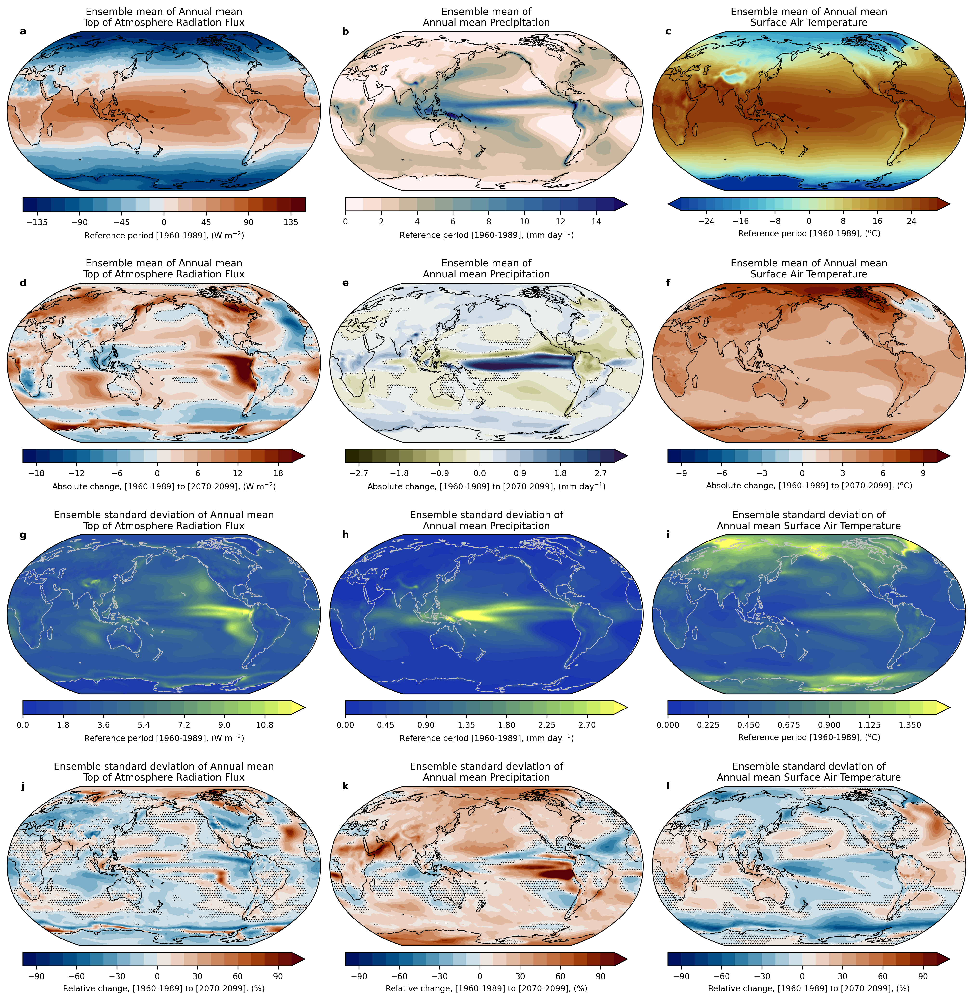

In [35]:
fig,ax = plt.subplots(4,3,figsize=(13.5, 14), dpi=300, facecolor='w', edgecolor='k',subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

titles=['Ensemble mean of Annual mean\nTop of Atmosphere Radiation Flux',
        'Ensemble mean of\nAnnual mean Precipitation',
        'Ensemble mean of Annual mean\nSurface Air Temperature',
        'Ensemble standard deviation of Annual mean\nTop of Atmosphere Radiation Flux',
        'Ensemble standard deviation of\nAnnual mean Precipitation',
        'Ensemble standard deviation of\nAnnual mean Surface Air Temperature']

UC_ohc=1e-21*(1e1)
fields=[toaf_em1,prec_em1,tref_em1,toaf_em2-toaf_em1,prec_em2-prec_em1,tref_em2-tref_em1,
        toaf_es1,prec_es1,tref_es1,(toaf_es2-toaf_es1)/toaf_es1*100.,(prec_es2-prec_es1)/prec_es1*100.,(tref_es2-tref_es1)/tref_es1*100.]

sigs=[toaf_em_pval,prec_em_pval,tref_em_pval,toaf_es_pval,prec_es_pval,tref_es_pval]

clabels=['Reference period [{}-{}]'.format(syr1,eyr1),'Absolute change, [{}-{}] to [{}-{}]'.format(syr1,eyr1,syr2,eyr2),
         'Reference period [{}-{}]'.format(syr1,eyr1),'Relative change, [{}-{}] to [{}-{}]'.format(syr1,eyr1,syr2,eyr2)]

units=['W m$^{-2}$','mm day$^{-1}$','$^{\mathrm{o}}$C']

levels=[np.linspace(-150,150,21),np.linspace(0,15,16)    ,np.linspace(-30,30,31),
        np.linspace(-20,20,21)  ,np.linspace(-3,3,21)    ,np.linspace(-10,10,21),
        np.linspace(0,12,21)    ,np.linspace(0,3,21)     ,np.linspace(0,1.5,21) ,
        np.linspace(-100,100,21),np.linspace(-100,100,21),np.linspace(-100,100,21)]

cmapss=[cm.vik  ,cm.lapaz_r,cm.roma_r,
        cm.vik  ,cm.broc_r ,cm.vik,
        cm.imola,cm.imola  ,cm.imola,
        cm.vik  ,cm.vik    ,cm.vik   ]

j=0
for i,a in enumerate(tqdm_notebook(ax.flat)) :
    if i//3!=3 : clabel=clabels[i//3]+', (%s)'%units[i%3]
    if i//3==3 : clabel=clabels[i//3]+', (%)'
    cbar_kwargs={'orientation':'horizontal','pad':0.03,'shrink':0.9,'label':clabel}
    fields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),cbar_kwargs=cbar_kwargs,levels=levels[i],cmap=cmapss[i])
    if i in [3,4,5,9,10,11]:
        sigs[j].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=[0,0.05,1000],hatches=[None,'.......'],add_colorbar=False,alpha=0.)
        j=j+1
             
    a.set_title('%s'%titles[(i%3)+(i//6)*3])
    a.set_global()
    if i//3==2 : a.coastlines(linewidth=0.6,color='silver')
    if i//3!=2 : a.coastlines(linewidth=0.6,color='black')
    a.text(0.05, 1.,'%s'%list(string.ascii_lowercase)[i], fontsize = 10, ha='center', va='center', fontweight='bold', transform=a.transAxes)

plt.tight_layout()
plt.show()
fig.savefig('/home/ryamaguchi/tmp_fig/pp_fig_e4_1_'+str(len(members))+'-members_'+today.strftime("%y%m%d")+'.pdf')

pos_x0=[]
pos_y0=[]
pos_x1=[]
pos_y1=[]
for a in ax.flat :
    pos_x0+=[a.get_position().x0]    
    pos_y0+=[a.get_position().y0]   
    pos_x1+=[a.get_position().x1]    
    pos_y1+=[a.get_position().y1]

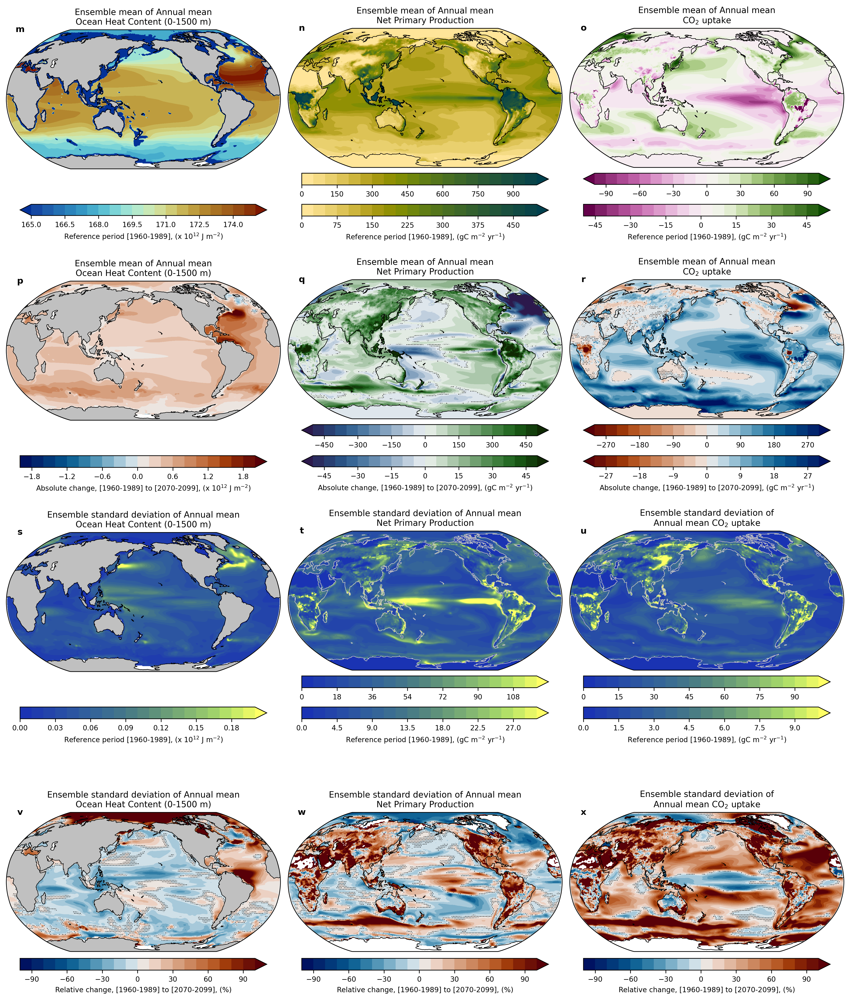

In [36]:
fig,ax = plt.subplots(4,3,figsize=(13.5, 16), dpi=300, facecolor='w', edgecolor='k',subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

titles=['Ensemble mean of Annual mean\nOcean Heat Content (0-1500 m)',
        'Ensemble mean of Annual mean\nNet Primary Production',
        'Ensemble mean of Annual mean\nCO$_{2}$ uptake',
        'Ensemble standard deviation of Annual mean\nOcean Heat Content (0-1500 m)',
        'Ensemble standard deviation of Annual mean\nNet Primary Production',
        'Ensemble standard deviation of\nAnnual mean CO$_{2}$ uptake']

UC_ohc=1e-10
ofields=[remap_pop_xy(ohc2_em1)*UC_ohc,remap_pop_xy(ONPP_em1),remap_pop_xy(OCO2_em1),
         remap_pop_xy(ohc2_em2-ohc2_em1)*UC_ohc,remap_pop_xy(ONPP_em2-ONPP_em1),remap_pop_xy(OCO2_em2-OCO2_em1),
         remap_pop_xy(ohc2_es1)*UC_ohc,remap_pop_xy(ONPP_es1),remap_pop_xy(OCO2_es1),
         remap_pop_xy((ohc2_es2-ohc2_es1)/ohc2_es1*100.),remap_pop_xy((ONPP_es2-ONPP_es1)/ONPP_es1*100.),remap_pop_xy((OCO2_es2-OCO2_es1)/OCO2_es1*100.) ]
lfields=['',xr.where(LNPP_em1<0.,0,LNPP_em1),LCO2_em1,'',(LNPP_em2-LNPP_em1),(LCO2_em2-LCO2_em1),
         '',LNPP_es1,LCO2_es1,'',(LNPP_es2-LNPP_es1)/LNPP_es1*100.,(LCO2_es2-LCO2_es1)/LCO2_es1*100.]

osigs=[remap_pop_xy(ohc2_em_pval),remap_pop_xy(ONPP_em_pval),remap_pop_xy(OCO2_em_pval),remap_pop_xy(ohc2_es_pval),remap_pop_xy(ONPP_es_pval),remap_pop_xy(OCO2_es_pval)]
lsigs=['',LNPP_em_pval,LCO2_em_pval,'',LNPP_es_pval,LCO2_es_pval]

clabels=['Reference period [{}-{}]'.format(syr1,eyr1),'Absolute change, [{}-{}] to [{}-{}]'.format(syr1,eyr1,syr2,eyr2),
         'Reference period [{}-{}]'.format(syr1,eyr1),'Relative change, [{}-{}] to [{}-{}]'.format(syr1,eyr1,syr2,eyr2)]

units=['x 10$^{12}$ J m$^{-2}$','gC m$^{-2}$ yr$^{-1}$','gC m$^{-2}$ yr$^{-1}$']

olevels=[np.linspace(165,175,21)     ,np.linspace(0,500,21)   ,np.linspace(-50,50,21),
         np.linspace(-2,2,21)    ,np.linspace(-50,50,21)  ,np.linspace(-30,30,21),
         np.linspace(0,0.20,21)  ,np.linspace(0, 30,21)   ,np.linspace(0, 10,21),
         np.linspace(-100,100,21),np.linspace(-100,100,21),np.linspace(-100,100,21)]

llevels=['',np.linspace(0,1000,21)  ,np.linspace(-100,100,21),
         '',np.linspace(-500,500,21),np.linspace(-300,300,21),
         '',np.linspace(0,120,21)   ,np.linspace(0,100,21),
         '',np.linspace(-100,100,21),np.linspace(-100,100,21)]

cmapss=[cm.roma_r,cm.bamako_r,cm.bam  ,
        cm.vik   ,cm.cork    ,cm.vik_r,
        cm.imola ,cm.imola   ,cm.imola,
        cm.vik   ,cm.vik     ,cm.vik    ]

j=0
for i,a in enumerate(tqdm_notebook(ax.flat)) :
    
    if i//3!=3 : clabel=clabels[i//3]+', (%s)'%units[i%3]
    if i//3==3 : clabel=clabels[i//3]+', (%)'

    if i%3==0 : opad=0.155
    if i%3!=0 : opad=0.01
    if i//3==3 : opad=0.03
    cbar_kwargso={'orientation':'horizontal','pad':opad ,'shrink':0.9,'label':clabel}
    ofields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),cbar_kwargs=cbar_kwargso,levels=olevels[i],cmap=cmapss[i])        
    cbar_kwargsl={'orientation':'horizontal','pad':0.03,'shrink':0.9,'label':''}
    if i%3!=0 and i//3!=3 : lfields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),cbar_kwargs=cbar_kwargsl,levels=llevels[i],cmap=cmapss[i])
    if i%3!=0 and i//3==3 : lfields[i].plot.contourf(ax=a,transform=ccrs.PlateCarree(),add_colorbar=False      ,levels=llevels[i],cmap=cmapss[i])
                    
    if i in [3,4,5,9,10,11]:
        osigs[j].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=[0,0.05,1000],hatches=[None,'.......'],add_colorbar=False,alpha=0)
        if j!=0 and j!=3 : lsigs[j].plot.contourf(ax=a,transform=ccrs.PlateCarree(),levels=[0,0.05,1000],hatches=[None,'.......'],add_colorbar=False,alpha=0)
        j=j+1
    
    a.set_title('%s'%titles[(i%3)+(i//6)*3])
    a.set_global()
    if i//3==2 :
        if i%3==0:
            a.coastlines(linewidth=0.6,color='black')
        else :
            a.coastlines(linewidth=0.6,color='silver')
    if i//3!=2 : a.coastlines(linewidth=0.6,color='black')
    if i%3==0 : a.add_feature(cf.LAND,color='silver')
    a.text(0.05, 1.,'%s'%list(string.ascii_lowercase)[i+12], fontsize = 10, ha='center', va='center', fontweight='bold', transform=a.transAxes)

plt.tight_layout()
plt.show()

fig.savefig('/home/ryamaguchi/tmp_fig/pp_fig_e4_2_'+str(len(members))+'-members_'+today.strftime("%y%m%d")+'.pdf')